In [1]:
import os
import re
import tqdm
from glob import glob
from pathlib import Path
import random as rnd

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from pprint import pprint
import graphviz

from collections import defaultdict
from bs4 import BeautifulSoup

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize

import xgboost as xgb

import time
from textblob import TextBlob

2024-01-19 13:51:44.262914: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE3 SSE4.1 SSE4.2 AVX AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Preprocessing

In [2]:
nltk.download('stopwords')
nltk.download('wordnet')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    text = text.strip().lower()

    text = re.sub(r"[^a-zA-Z0-9]", " ", text)  # Removing non-alphanumeric characters
    text = re.sub(r"\b\d+\b", "<NUM>", text) # Replacing numeric values with <NUM>

    words = text.split()

    words = [word for word in words if word not in stop_words]  # Removing stopwords
    words = [lemmatizer.lemmatize(word) for word in words]  # Lemmatization

    return " ".join(words)


[nltk_data] Downloading package stopwords to /home/denizm/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/denizm/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
data_path = "Data/dataset/*.html"

code2convos = dict()

pbar = tqdm.tqdm(sorted(list(glob(data_path))))
for path in pbar:
    file_code = os.path.basename(path).split(".")[0]
    with open(path, "r", encoding="latin1") as fh:
            
        # Getting the file ID to use it as a key later on
        fid = os.path.basename(path).split(".")[0]

        # Reading the HTML file
        html_page = fh.read()

        # Parsing the HTML file with bs4
        soup = BeautifulSoup(html_page, "html.parser")

        # Grabbing the conversations with the data-testid pattern
        data_test_id_pattern = re.compile(r"conversation-turn-[0-9]+")
        conversations = soup.find_all("div", attrs={"data-testid": data_test_id_pattern})

        convo_texts = []

        for i, convo in enumerate(conversations):
            convo = convo.find_all("div", attrs={"data-message-author-role":re.compile( r"[user|assistant]") })
            if len(convo) > 0:
                role = convo[0].get("data-message-author-role")

                # PREPROCESSING
                text = convo[0].text
                processed_text = preprocess_text(text)

                convo_texts.append({
                        "role" : role,
                        "text" : processed_text
                    }
                )
                
        code2convos[file_code] = convo_texts

100%|██████████| 127/127 [00:08<00:00, 14.70it/s]


In [4]:
# Sample entry
pprint(code2convos)

{'0031c86e-81f4-4eef-9e0e-28037abf9883': [{'role': 'user',
                                           'text': 'load csv file panda python '
                                                   'file named cs412 hw1 '
                                                   'dataset csv contains '
                                                   'column like specie island '
                                                   'sex diet year life stage '
                                                   'body mass g bill length mm '
                                                   'bill depth mm flipper '
                                                   'length mm health metric'},
                                          {'role': 'assistant',
                                           'text': 'load csv file panda '
                                                   'dataframe python using '
                                                   'panda read csv function '
                      

# Matching Prompts with Questions
We matched the prompts with the questions in the homework using the code cells below. Firstly, for each student, the prompts were vectorized with a TF-IDF vectorizer, with the empty prompts marked and excluded along the way. Then, the same was done for the questions. A cosine similarity matrix was constructed using the two.

The similarity matrix was used for outlier treatment. Codes (identifying students) associated with less than 15% similarity or contained empty prompts were eliminated.

Finally, the treated data was vectorized with Word2Vec in 2 different ways: 1) per student and 2) as a whole, once. The resulting data was used to build another cosine similarity matrix. The final similarity matrix as well as the two Word2Vec vectors formed the basis the dataset we used for the machine learning algorithms.

In [5]:
# Creating a list of user prompts
prompts = []
code2prompts = defaultdict(list)
for code, convos in code2convos.items():
    user_prompts = []
    for conv in convos:
        if conv["role"] == "user":
            prompts.append(conv["text"])
            user_prompts.append(conv["text"])
    code2prompts[code] = user_prompts

pprint(code2prompts["0031c86e-81f4-4eef-9e0e-28037abf9883"])

['load csv file panda python file named cs412 hw1 dataset csv contains column '
 'like specie island sex diet year life stage body mass g bill length mm bill '
 'depth mm flipper length mm health metric',
 'provide python code understand dataset using panda find shape dataset '
 'display variable name display summary dataset info function show first <NUM> '
 'row using head function',
 'preprocess data <NUM> check missing value handle either dropping filling '
 'common value ensure enough data training model use <NUM> data training <NUM> '
 'testing <NUM> encode label mapping using map function mapping name sex map '
 'female <NUM> male <NUM> island map biscoe <NUM> dream <NUM> torgensen <NUM> '
 'diet map fish <NUM> krill <NUM> squid <NUM> parental <NUM> life stage map '
 'chick <NUM> juvenile <NUM> adult <NUM> health metric map healthy <NUM> '
 'overweight <NUM> underweight <NUM> dataset named df',
 'already provide code please recreate part shuffling needed <NUM> shuffle '
 'datafra

In [6]:
questions = [
    """Initialize
*   First make a copy of the notebook given to you as a starter.
*   Make sure you choose Connect form upper right.
*   You may upload the data to the section on your left on Colab, than right click on the .csv file and get the path of the file by clicking on "Copy Path". You will be using it when loading the data.

""",
#####################
    """Load training dataset (5 pts)
    *  Read the .csv file with the pandas library
""",
#####################
"""Understanding the dataset & Preprocessing (15 pts)
Understanding the Dataset: (5 pts)
> - Find the shape of the dataset (number of samples & number of attributes). (Hint: You can use the **shape** function)
> - Display variable names (both dependent and independent).
> - Display the summary of the dataset. (Hint: You can use the **info** function)
> - Display the first 5 rows from training dataset. (Hint: You can use the **head** function)
Preprocessing: (10 pts)

> - Check if there are any missing values in the dataset. If there are, you can either drop these values or fill it with most common values in corresponding rows. **Be careful that you have enough data for training the  model.**

> - Encode categorical labels with the mappings given in the cell below. (Hint: You can use **map** function)
""",
"""Set X & y, split data (5 pts)

*   Shuffle the dataset.
*   Seperate your dependent variable X, and your independent variable y. The column health_metrics is y, the rest is X.
*   Split training and test sets as 80% and 20%, respectively.
""",
#####################
"""Features and Correlations (10 pts)

* Correlations of features with health (4 points)
Calculate the correlations for all features in dataset. Highlight any strong correlations with the target variable. Plot your results in a heatmap.

* Feature Selection (3 points)
Select a subset of features that are likely strong predictors, justifying your choices based on the computed correlations.

* Hypothetical Driver Features (3 points)
Propose two hypothetical features that could enhance the model's predictive accuracy for Y, explaining how they might be derived and their expected impact. Show the resulting correlations with target variable.

* __Note:__ You get can get help from GPT.
""",
#####################
"""Tune Hyperparameters (20 pts)
* Choose 2 hyperparameters to tune. You can use the Scikit learn decision tree documentation for the available hyperparameters *(Hyperparameters are listed under "Parameters" in the documentation)*. Use GridSearchCV for hyperparameter tuning, with a cross-validation value of 5. Use validation accuracy to pick the best hyper-parameter values. (15 pts)
-Explain the hyperparameters you chose to tune. *(What are the hyperparameters you chose? Why did you choose them?)* (5 pts)
""",
#####################
"""Re-train and plot the decision tree with the hyperparameters you have chosen (15 pts)
- Re-train model with the hyperparameters you have chosen in part 5). (10 pts)
- Plot the tree you have trained. (5 pts)
Hint: You can import the **plot_tree** function from the sklearn library.
""",
#####################
"""Test your classifier on the test set (20 pts)
- Predict the labels of testing data using the tree you have trained in step 6. (10 pts)
- Report the classification accuracy. (2 pts)
- Plot & investigate the confusion matrix. Fill the following blanks. (8 pts)
> The model most frequently mistakes class(es) _________ for class(es) _________.
Hint: You can use the confusion_matrix function from sklearn.metrics
""",
#####################
"""Find the information gain on the first split (10 pts)""",
#####################
]

In [7]:
# Preprocessing the questions
questions = [preprocess_text(question) for question in questions]

## Vectorising with TF-IDF

In [8]:
vectorizer = TfidfVectorizer()
vectorizer = vectorizer.fit(prompts + questions)

In [9]:
questions_TF_IDF = pd.DataFrame(vectorizer.transform(questions).toarray(), columns=vectorizer.get_feature_names_out())
questions_TF_IDF.head()

,00m,0320ab1685fe,037ede8d8a7c,050f41148117,068bf39b6ee6,0b5f3f31d5b9,0d1eec384a07,0e5bf1fd82b0,0e9dfaccb77d,0eb16c68ccfb,...,youve,ypred,yticklabels,yticks,zaman,zd,zero,zerodivisionerror,zeroth,zip
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
# Creating a TF-IDF model for each student and a dictionary that maps each student code to its
# TF-IDF matrix (formed with the corresponding prompts)
code2prompts_TF_IDF = dict()
codes_with_no_prompts = []

for code, user_prompts in code2prompts.items():
    if len(user_prompts) == 0: # Excluding empty prompts and adding the codes associated with them to a list (to eliminate them from scores later)
        print(code+".html")
        codes_with_no_prompts.append(code)
        continue
    prompts_TF_IDF = pd.DataFrame(vectorizer.transform(user_prompts).toarray(), columns=vectorizer.get_feature_names_out())
    code2prompts_TF_IDF[code] = prompts_TF_IDF

print(code2prompts_TF_IDF["089eb66d-4c3a-4f58-b98f-a3774a2efb34"].shape)
code2prompts_TF_IDF["089eb66d-4c3a-4f58-b98f-a3774a2efb34"].head()

139235c7-736c-4237-92f0-92e8c116832c.html
668ad17e-0240-49f7-b5a7-d22e502554c6.html
b0640e51-6879-40cb-a4f5-329f952ef99d.html
da6b70d5-29f6-491a-ad46-037c77067128.html
(86, 2866)


,00m,0320ab1685fe,037ede8d8a7c,050f41148117,068bf39b6ee6,0b5f3f31d5b9,0d1eec384a07,0e5bf1fd82b0,0e9dfaccb77d,0eb16c68ccfb,...,youve,ypred,yticklabels,yticks,zaman,zd,zero,zerodivisionerror,zeroth,zip
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
# Demonstrating the structure of the dictionary
print("The user with code " + list(code2prompts_TF_IDF.keys())[0] + " has " + str(len(code2prompts_TF_IDF[list(code2prompts_TF_IDF.keys())[0]])) + " prompts.")
print("The first three prompts have the following TF-IDF matrices:\n" + str(code2prompts_TF_IDF[list(code2prompts_TF_IDF.keys())[0]].head(3)))

The user with code 0031c86e-81f4-4eef-9e0e-28037abf9883 has 14 prompts.
The first three prompts have the following TF-IDF matrices:
   00m  0320ab1685fe  037ede8d8a7c  050f41148117  068bf39b6ee6  0b5f3f31d5b9  \
0  0.0           0.0           0.0           0.0           0.0           0.0   
1  0.0           0.0           0.0           0.0           0.0           0.0   
2  0.0           0.0           0.0           0.0           0.0           0.0   

   0d1eec384a07  0e5bf1fd82b0  0e9dfaccb77d  0eb16c68ccfb  ...  youve  ypred  \
0           0.0           0.0           0.0           0.0  ...    0.0    0.0   
1           0.0           0.0           0.0           0.0  ...    0.0    0.0   
2           0.0           0.0           0.0           0.0  ...    0.0    0.0   

   yticklabels  yticks  zaman   zd  zero  zerodivisionerror  zeroth  zip  
0          0.0     0.0    0.0  0.0   0.0                0.0     0.0  0.0  
1          0.0     0.0    0.0  0.0   0.0                0.0     0.0  0.0  
2

In [12]:
# Creating a dictionary that pairs each student code with the corresponding 
# cosine similarity (between prompts and questions) vector
code2cosine = dict()
for code, user_prompts_TF_IDF in code2prompts_TF_IDF.items():
    code2cosine[code] = pd.DataFrame(cosine_similarity(questions_TF_IDF,user_prompts_TF_IDF))

print(code2cosine["089eb66d-4c3a-4f58-b98f-a3774a2efb34"].shape)
code2cosine["089eb66d-4c3a-4f58-b98f-a3774a2efb34"].head()

(9, 86)


,0,1,2,3,4,5,6,7,8,9,...,76,77,78,79,80,81,82,83,84,85
0,0.027961,0.325685,0.010234,0.026727,0.015988,0.018253,0.000000,0.000000,0.0,0.000000,...,0.0,0.000000,0.110769,0.0,0.0,0.0,0.031876,0.000000,0.000000,0.000000
1,0.091888,0.591754,0.134716,0.092596,0.000000,0.098289,0.000000,0.000000,0.0,0.000000,...,0.0,0.064270,0.000000,0.0,0.0,0.0,0.000000,0.018104,0.000000,0.000000
2,0.000000,0.049370,0.782893,0.453437,0.092462,0.269301,0.016293,0.060094,0.0,0.120399,...,0.0,0.090740,0.034346,0.0,0.0,0.0,0.000000,0.039551,0.000000,0.025996
3,0.000000,0.020172,0.229466,0.087328,0.015270,0.214392,0.031070,0.000000,0.0,0.000000,...,0.0,0.230419,0.000000,0.0,0.0,0.0,0.000000,0.111224,0.000000,0.041737
4,0.000000,0.008980,0.083738,0.021831,0.000000,0.120831,0.000000,0.000000,0.0,0.000000,...,0.0,0.121673,0.008365,0.0,0.0,0.0,0.000000,0.427439,0.179476,0.105469


In [13]:
# Taking the highest cosine similarity value from each row (i.e. for each question) for each student and assigning the resulting vector to the student
code2questionmapping = dict()
for code, cosine_scores in code2cosine.items():
    code2questionmapping[code] = code2cosine[code].max(axis=1).tolist()

# Sample cosine similarity vector for a student
print(code2questionmapping["089eb66d-4c3a-4f58-b98f-a3774a2efb34"])

# Creating a dataframe that displays the mapping better
question_mapping_scores = pd.DataFrame(code2questionmapping).T
question_mapping_scores.reset_index(inplace=True)
question_mapping_scores.rename(columns={i: f"Q_{i}" for i in range(len(questions))}, inplace=True)
question_mapping_scores.rename(columns={"index": "code"}, inplace=True)

# Displaying the dataframe
print(question_mapping_scores)

[0.32568521031207914, 0.5917538546315142, 0.7828931547847676, 0.6657936064278487, 0.7390903214479634, 0.8942115507195443, 0.6812223838792494, 0.94918673722751, 0.5104932519054528]
                                     code       Q_0       Q_1       Q_2  \
0    0031c86e-81f4-4eef-9e0e-28037abf9883  0.115047  0.378839  0.502121   
1    0225686d-b825-4cac-8691-3a3a5343df2b  0.166088  0.764583  0.761545   
2    041f950b-c013-409a-a642-cffff60b9d4b  0.104277  0.289911  0.504770   
3    04f91058-d0f8-4324-83b2-19c671f433dc  0.059813  0.140847  0.181471   
4    089eb66d-4c3a-4f58-b98f-a3774a2efb34  0.325685  0.591754  0.782893   
..                                    ...       ...       ...       ...   
118  f24219d6-07f0-4baf-80ac-18475dc5b66f  0.095913  0.200562  0.273407   
119  f2f18684-4a16-4c05-a2d1-c0f96d1de869  0.053587  0.180677  0.339981   
120  f852596d-fdca-45aa-9050-d4f76ce6a53c  0.133315  0.952540  0.968612   
121  f8ec3336-fd48-4654-ad98-62ccfb96d096  0.133315  0.952540  0.99919

# Outlier Treatment

## Dropping Outliers and Students with Empty Prompts (Preferred Approach)

In [14]:
# Outliers [in this context]: Dummy or highly inconsistent prompts

# Pipeline for detecting an outlier (an example):
# Filtering the dataframe based on the desired code
desired_code = "6a2003ad-a05a-41c9-9d48-e98491a90499"
desired_file_scores = question_mapping_scores[question_mapping_scores['code'] == desired_code]

# Calculating the average distance for the specific code
average_distance = desired_file_scores.iloc[:, 1:].mean(axis=1).values[0]

# Printing the average distance
print(f"The average distance for code {desired_code} is: {average_distance}")

threshold = 0.15

question_mapping_scores['average_distance'] = question_mapping_scores.iloc[:, 1:].mean(axis=1)

filtered_scores = question_mapping_scores[question_mapping_scores['average_distance'] >= threshold].reset_index(drop=True)

filtered_scores = filtered_scores.drop(columns=['average_distance']).reset_index(drop=True)

print(f"Number of rows in filtered_scores: {len(filtered_scores)}")

dropped_codes = question_mapping_scores[~question_mapping_scores['code'].isin(filtered_scores['code'])]['code'].tolist()

# Print the codes of dropped entries
print("Codes of dropped entries:")
print(dropped_codes)

question_mapping_scores = filtered_scores

The average distance for code 6a2003ad-a05a-41c9-9d48-e98491a90499 is: 0.0
Number of rows in filtered_scores: 118
Codes of dropped entries:
['38296004-7336-4797-9db4-662a48309a1c', '6a2003ad-a05a-41c9-9d48-e98491a90499', '6b4e988c-eead-46ff-a35b-b2fd325b2698', '746b8f06-1e89-43b8-b73c-1121eecfc854', 'c0f51763-0c69-45fb-a4d7-6906d53db43d']


## Data Imputation with kNN (Alternative Approach)

In [ ]:
# Outliers [in this context]: Dummy or highly inconsistent prompts

# Calculating the average distance for each code
question_mapping_scores['average_distance'] = question_mapping_scores.iloc[:, 1:].mean(axis=1)

# Setting the threshold for outliers
threshold = 0.15

# Identifying outliers
outliers = question_mapping_scores[question_mapping_scores['average_distance'] < threshold]

# Setting up the k-NN model
k = 5  # Number of neighbors; you can adjust this number as needed
nn_model = NearestNeighbors(n_neighbors=k+1)  # +1 because the point itself is included

# Training the model with non-outlier data
non_outliers = question_mapping_scores[question_mapping_scores['average_distance'] >= threshold]
nn_model.fit(non_outliers.iloc[:, 1:-1])  # Exclude 'code' and 'average_distance' columns

# For each outlier, find its nearest neighbors and replace its data
for index, outlier in outliers.iterrows():
    distances, indices = nn_model.kneighbors([outlier.iloc[1:-1]], n_neighbors=k+1)

    # Exclude the first neighbor as it is the outlier itself
    nearest_neighbors = non_outliers.iloc[indices[0][1:], 1:-1]

    # Replace outlier data with the mean of its nearest neighbors
    question_mapping_scores.loc[index, 1:-1] = nearest_neighbors.mean(axis=0)

# Dropping the average_distance column as it's no longer needed
question_mapping_scores = question_mapping_scores.drop(columns=['average_distance'])

# Print the number of rows after processing
print(f"Number of rows after processing: {len(question_mapping_scores)}")

## Vectorising with Word2Vec

In [15]:
# TF-IDF looks for direct word matches; word2vec tries to infer the context
nltk.download('punkt')

# Creating a word2vec model using all prompts
tokenized_prompts = [word_tokenize(prompt) for prompt in prompts if len(prompt) > 0]
tokenized_questions = [word_tokenize(question) for question in questions if len(question) > 0]

model = Word2Vec(tokenized_prompts + tokenized_questions, vector_size=500, window=5, min_count=1, workers=4)

prompts_embeddings = [np.mean([model.wv[word] for word in prompt], axis=0) for prompt in tokenized_prompts]
questions_embeddings = [np.mean([model.wv[word] for word in question], axis=0) for question in tokenized_questions]

code2cosine_word2vec = dict()
for code, prompt_embedding in zip(code2prompts.keys(), prompts_embeddings):
    code2cosine_word2vec[code] = [cosine_similarity([question_embedding], [prompt_embedding])[0][0] for question_embedding in questions_embeddings]

code2questionmapping_word2vec = pd.DataFrame(code2cosine_word2vec).T
code2questionmapping_word2vec.reset_index(inplace=True, drop=False)
code2questionmapping_word2vec.rename(columns={i: f"Q_{i}" for i in range(len(questions))}, inplace=True)
code2questionmapping_word2vec.rename(columns={"index": "code"}, inplace=True)

zero_length_prompts_codes = [code for code, prompt in code2prompts.items() if len(prompt) == 0]
code2questionmapping_word2vec_filtered = code2questionmapping_word2vec[~code2questionmapping_word2vec['code'].isin(zero_length_prompts_codes)]

question_mapping_scores = code2questionmapping_word2vec_filtered

[nltk_data] Downloading package punkt to /home/denizm/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [16]:
# Creating a word2vec model for each student
columns = ["code"] + ["w" + str(i) for i in range(500)]
code2word2vec = pd.DataFrame(columns=columns)

for code in code2prompts:
    if len(code2prompts[code]) != 0:
        model_w2v = Word2Vec(code2prompts[code], vector_size=500, window=5, min_count=1, workers=4)
        
        prompt_embeddings = []
        for prompt in code2prompts[code]:
            word_vectors = [model_w2v.wv[word] for word in prompt if word in model_w2v.wv]
            if word_vectors:  # Checking if the list is not empty
                average_vector = np.mean(word_vectors, axis=0)
                prompt_embeddings.append(average_vector)
            else:
                pass
        
        if prompt_embeddings:
            code_embedding = np.mean(prompt_embeddings, axis=0)

            row = [code] + code_embedding.tolist()
            code2word2vec = code2word2vec.append(pd.Series(row, index=columns), ignore_index=True)
    else:
        pass

print(code2word2vec.shape)
code2word2vec.head()

/tmp/ipykernel_48672/3812870271.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  code2word2vec = code2word2vec.append(pd.Series(row, index=columns), ignore_index=True)
/tmp/ipykernel_48672/3812870271.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  code2word2vec = code2word2vec.append(pd.Series(row, index=columns), ignore_index=True)
/tmp/ipykernel_48672/3812870271.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  code2word2vec = code2word2vec.append(pd.Series(row, index=columns), ignore_index=True)
/tmp/ipykernel_48672/3812870271.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  code2word2vec = code2word2vec.append(pd.Ser

(123, 501)


/tmp/ipykernel_48672/3812870271.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  code2word2vec = code2word2vec.append(pd.Series(row, index=columns), ignore_index=True)
/tmp/ipykernel_48672/3812870271.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  code2word2vec = code2word2vec.append(pd.Series(row, index=columns), ignore_index=True)
/tmp/ipykernel_48672/3812870271.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  code2word2vec = code2word2vec.append(pd.Series(row, index=columns), ignore_index=True)


,code,w0,w1,w2,w3,w4,w5,w6,w7,w8,...,w490,w491,w492,w493,w494,w495,w496,w497,w498,w499
0,0031c86e-81f4-4eef-9e0e-28037abf9883,0.099670,0.003658,0.106969,0.062961,-0.223330,-0.158447,0.018016,0.203831,-0.130004,...,0.102474,0.020584,0.140552,0.137906,0.040766,0.054028,-0.083299,0.000560,-0.073790,0.081241
1,0225686d-b825-4cac-8691-3a3a5343df2b,0.091412,0.060693,0.090587,0.081218,-0.141467,-0.147411,-0.013051,0.218732,-0.109054,...,0.080626,-0.024429,0.105500,0.109587,0.071935,-0.034303,-0.076954,0.086845,-0.047115,0.038489
2,041f950b-c013-409a-a642-cffff60b9d4b,0.145156,0.032113,0.090339,0.100405,-0.133006,-0.082006,-0.030480,0.205368,-0.034748,...,0.065389,-0.021369,0.107236,0.111493,0.054981,0.046572,-0.041067,0.045461,-0.069470,0.022174
3,04f91058-d0f8-4324-83b2-19c671f433dc,0.007997,0.001373,0.006794,0.005153,-0.014309,-0.012841,-0.002441,0.014604,-0.006192,...,0.006853,0.000466,0.007853,0.010195,0.004179,0.001311,-0.003819,0.004759,-0.007017,0.004175
4,089eb66d-4c3a-4f58-b98f-a3774a2efb34,0.108614,0.062242,0.103617,0.069216,-0.141540,-0.129529,-0.013520,0.201344,-0.085722,...,0.082623,0.025339,0.080433,0.075766,0.028062,0.025099,-0.055167,0.097092,-0.024599,0.080686


## Normalization

Data was normalized using Min-Max scaling. The normalized data was used only for neural network training; non-normalized data was used for other algorithms.

In [17]:
# Reading the scores
scores = pd.read_csv("Data/scores.csv", sep=",")
scores["code"] = scores["code"].apply(lambda x: x.strip())

scores = scores[["code", "grade"]]

# Removing grades received by outlier students
scores = scores[~scores["code"].isin(dropped_codes)].reset_index(drop=True)
scores = scores[~scores["code"].isin(codes_with_no_prompts)].reset_index(drop=True)
scores = scores[scores["grade"] >= 70].reset_index(drop=True)

# Displaying some scores
print(scores.shape)
scores.head()

(130, 2)


,code,grade
0,04f91058-d0f8-4324-83b2-19c671f433dc,97.0
1,81fdeb2a-e7e5-4a05-8058-d31ea579b0d9,94.0
2,6a903495-c5be-4263-b4dd-75e2bbc30434,97.0
3,6d5742c1-77c4-429c-8f6e-ef1262ca5557,93.0
4,dd898b12-b04b-404e-9b59-f846a162c177,98.0


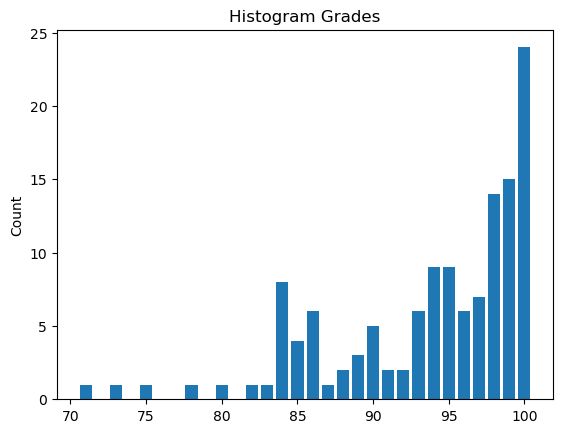

In [18]:
# The distribution of grades
plt.title('Histogram Grades')
plt.hist(scores["grade"], rwidth=.8, bins=np.arange(min(scores["grade"]), max(scores["grade"])+2) - 0.5)
plt.ylabel('Count')
plt.show()

In [19]:
# Min-Max scaling
scaler = MinMaxScaler()

# Scaling the scores
scaled_values = scaler.fit_transform(scores[scores.columns[1:]])

# Converting the scaled values back into a dataframe
normalized_scores = pd.DataFrame(scaled_values, columns=scores.columns[1:])

# Merging the 'code' column from the original 'scores' dataframe with the new 'normalized_scores'
normalized_scores = pd.merge(scores[["code"]], normalized_scores, left_index=True, right_index=True)

print(normalized_scores)


                                     code     grade
0    04f91058-d0f8-4324-83b2-19c671f433dc  0.896552
1    81fdeb2a-e7e5-4a05-8058-d31ea579b0d9  0.793103
2    6a903495-c5be-4263-b4dd-75e2bbc30434  0.896552
3    6d5742c1-77c4-429c-8f6e-ef1262ca5557  0.758621
4    dd898b12-b04b-404e-9b59-f846a162c177  0.931034
..                                    ...       ...
125  e779a2d6-6e4e-4ade-8a30-d624166c2ab3  0.379310
126  6c37a2d7-f786-4fc2-ba7a-04c3f961a365  0.620690
127  b24c3a33-2952-4ae4-9f2d-643d8fdbc600  0.241379
128  8be8e839-6dd0-44e0-b039-170b5b77cf2a  0.517241
129  a014d72a-81ad-43a4-8a2c-8046b7666320  0.689655

[130 rows x 2 columns]


# Feature Engineering
Possibly predictive features:
* Number of prompts that a user asked
* Number of complaints that a user made e.g "the code gives this error!"
* The average number of characters in a user's prompts
* Whether context was given in the first prompt
* Number of apologies by ChatGPT
* Number of ideal student keywords (words used by the best students)
* Sentiment score

In [20]:
# Finding the best students (those who scored 100)
best_scores = scores[scores["grade"] == 100]

best_students = best_scores["code"].tolist()
print(len(best_students))
print("The best students are: " + str(best_students))

24
The best students are: ['ba18e4e8-2c26-46d4-ba31-cc21947aabd5', '58bee29c-a749-463e-8d56-c4edf0815b3f', '51f35201-da77-4b6d-a455-99cc84195c5c', '223ae726-cb25-49df-a125-c4af3519c8e8', 'e264c424-a241-43f7-acca-9fbbf21dc1c6', 'f2f18684-4a16-4c05-a2d1-c0f96d1de869', 'c21be348-17bd-4fdd-88f5-137f6a13cdee', 'c91d6fef-baf5-4e77-8bfc-b14fb7fc770d', '58fcd378-aa29-4067-813c-bb4de525428e', '5a62a8ee-c67c-475e-bd85-cf6d83c90ea9', '5a62a8ee-c67c-475e-bd85-cf6d83c90ea9', '089eb66d-4c3a-4f58-b98f-a3774a2efb34', 'f8ec3336-fd48-4654-ad98-62ccfb96d096', '36bab6e3-0d16-4626-846b-33c0384f0c79', '5541316f-6fbd-4441-b513-ac252e6355ec', '97f57cf9-4f02-4f8c-b65c-8ea0009a82a2', '97f57cf9-4f02-4f8c-b65c-8ea0009a82a2', '7b0ecddc-caa5-4b81-88ea-cd65a7270900', '17bd62e7-6792-4399-a573-07456a73901b', '26d95379-e2f1-454c-a9d2-60cd80bc06a5', '745bb746-6467-4146-8ef5-55f3ee3f589e', '1b54e38b-3b1d-425e-835a-d1e0fb2694fc', '27de4332-d81f-47a2-b2a9-c0b023a30919', '1038cb22-8ad2-4030-b44a-59f10352e91c']


In [21]:
prompts_of_best_students = [code2prompts[code] for code in best_students]

# Finding words most frequently used by the best students
counts = {}
for prompts in prompts_of_best_students:
    for prompt in prompts:
        prompt_list = prompt.split()
        for word in prompt_list:
            if word not in counts:
                counts[word] = 1
            else:
                counts[word] += 1

# Sorting the words by their counts
sorted_counts = sorted(counts.items(), key=lambda x: x[1], reverse=True)
print("Top 10 words in best students' prompts: " + str(sorted_counts[1:11]))

sorted_keys = sorted(counts, key=counts.get, reverse=True)
best_words = sorted_keys[1:11] #first one is num, so skip that
print("Top 10 words in best students' prompts: " + str(best_words))

Top 10 words in best students' prompts: [('df', 575), ('health', 466), ('metric', 441), ('feature', 435), ('correlation', 423), ('value', 402), ('map', 378), ('mm', 354), ('x', 352), ('print', 337)]
Top 10 words in best students' prompts: ['df', 'health', 'metric', 'feature', 'correlation', 'value', 'map', 'mm', 'x', 'print']


In [22]:
def is_context_in_first_prompt(prompts):
    if len(prompts) == 0:
        return 0
    
    first_prompt= prompts[0]

    context_words = ["python", "machine learning", "computer science", "cs", "decision tree", "scikit-learn", "classifier", "classification", "classifiers", "classifications", "trees", "tree", "decision"]

    for word in context_words:
        if word in first_prompt:
            return 1
    return 0

In [23]:
code2features = defaultdict(lambda : defaultdict(int))

keywords2search = ["error", "no", "thank", "Entropy"]
keywords2search = [k.lower() for k in keywords2search]

apology_keywords = ["sorry", "apologize", "apology", "apologies", "oversight"]
apology_keywords = [k.lower() for k in apology_keywords]

for code, convs in code2convos.items():
    if len(convs) == 0:
        print(code)
        continue
    for c in convs:
        text = c["text"].lower()
        if c["role"] == "user": # User
            # Counting user prompts
            code2features[code]["#user_prompts"] += 1

            sentiment_score = TextBlob(text).sentiment.polarity
            code2features[code]["sentiment_score"] += sentiment_score

            # Counting the keywords
            for kw in keywords2search:
                code2features[code][f"#{kw}"] +=  len(re.findall(rf"\b{kw}\b", text))
            
            # Counting ideal words
            for bw in best_words:
                code2features[code][f"#{bw}"] +=  len(re.findall(rf"\b{bw}\b", text))

            # Determining whether context was provided in the first prompt
            code2features[code]["context_in_first_prompt"] = is_context_in_first_prompt(code2prompts[code])

            code2features[code]["prompt_avg_chars"] += len(text)
        else: # ChatGPT
            code2features[code]["response_avg_chars"] += len(text)

            # Counting apologies
            for kw in apology_keywords:
                code2features[code][f"#{kw}"] +=  len(re.findall(rf"\b{kw}\b", text))

        code2features[code]["prompt_avg_chars"] /= code2features[code]["#user_prompts"]
        code2features[code]["response_avg_chars"] /= code2features[code]["#user_prompts"]

139235c7-736c-4237-92f0-92e8c116832c
668ad17e-0240-49f7-b5a7-d22e502554c6
b0640e51-6879-40cb-a4f5-329f952ef99d
da6b70d5-29f6-491a-ad46-037c77067128


In [24]:
# Gathering the features in a dataframe
df = pd.DataFrame(code2features).T
df.head(5)

,#user_prompts,sentiment_score,#error,#no,#thank,#entropy,#df,#health,#metric,#feature,...,#x,#print,context_in_first_prompt,prompt_avg_chars,response_avg_chars,#sorry,#apologize,#apology,#apologies,#oversight
0031c86e-81f4-4eef-9e0e-28037abf9883,14.0,1.265795,3.0,0.0,0.0,0.0,5.0,14.0,14.0,14.0,...,2.0,0.0,1.0,1.749561,166.522523,0.0,1.0,0.0,0.0,1.0
0225686d-b825-4cac-8691-3a3a5343df2b,18.0,1.524702,0.0,0.0,0.0,3.0,0.0,6.0,4.0,4.0,...,2.0,0.0,0.0,0.158725,82.011803,0.0,0.0,0.0,0.0,0.0
041f950b-c013-409a-a642-cffff60b9d4b,9.0,0.184702,3.0,0.0,1.0,7.0,0.0,8.0,8.0,9.0,...,3.0,0.0,1.0,0.154633,9.155298,0.0,4.0,1.0,0.0,3.0
04f91058-d0f8-4324-83b2-19c671f433dc,20.0,0.087500,1.0,0.0,0.0,4.0,0.0,2.0,3.0,7.0,...,1.0,0.0,0.0,0.070617,81.803345,0.0,1.0,0.0,0.0,0.0
089eb66d-4c3a-4f58-b98f-a3774a2efb34,86.0,9.962761,4.0,0.0,0.0,46.0,15.0,34.0,24.0,38.0,...,19.0,7.0,0.0,0.010819,13.885261,0.0,4.0,5.0,0.0,2.0


In [25]:
df.reset_index(inplace=True, drop=False)
df.rename(columns={"index": "code"}, inplace=True)
df.head()

,code,#user_prompts,sentiment_score,#error,#no,#thank,#entropy,#df,#health,#metric,...,#x,#print,context_in_first_prompt,prompt_avg_chars,response_avg_chars,#sorry,#apologize,#apology,#apologies,#oversight
0,0031c86e-81f4-4eef-9e0e-28037abf9883,14.0,1.265795,3.0,0.0,0.0,0.0,5.0,14.0,14.0,...,2.0,0.0,1.0,1.749561,166.522523,0.0,1.0,0.0,0.0,1.0
1,0225686d-b825-4cac-8691-3a3a5343df2b,18.0,1.524702,0.0,0.0,0.0,3.0,0.0,6.0,4.0,...,2.0,0.0,0.0,0.158725,82.011803,0.0,0.0,0.0,0.0,0.0
2,041f950b-c013-409a-a642-cffff60b9d4b,9.0,0.184702,3.0,0.0,1.0,7.0,0.0,8.0,8.0,...,3.0,0.0,1.0,0.154633,9.155298,0.0,4.0,1.0,0.0,3.0
3,04f91058-d0f8-4324-83b2-19c671f433dc,20.0,0.087500,1.0,0.0,0.0,4.0,0.0,2.0,3.0,...,1.0,0.0,0.0,0.070617,81.803345,0.0,1.0,0.0,0.0,0.0
4,089eb66d-4c3a-4f58-b98f-a3774a2efb34,86.0,9.962761,4.0,0.0,0.0,46.0,15.0,34.0,24.0,...,19.0,7.0,0.0,0.010819,13.885261,0.0,4.0,5.0,0.0,2.0


In [26]:
# Integrating mapping scores to the dataframe
df = pd.merge(df, question_mapping_scores, on="code", how="left")

print(df.shape)
df.head()

(123, 34)


,code,#user_prompts,sentiment_score,#error,#no,#thank,#entropy,#df,#health,#metric,...,#oversight,Q_0,Q_1,Q_2,Q_3,Q_4,Q_5,Q_6,Q_7,Q_8
0,0031c86e-81f4-4eef-9e0e-28037abf9883,14.0,1.265795,3.0,0.0,0.0,0.0,5.0,14.0,14.0,...,1.0,0.388422,0.537249,0.449868,0.499696,0.486473,0.228484,0.174556,0.232616,0.273294
1,0225686d-b825-4cac-8691-3a3a5343df2b,18.0,1.524702,0.0,0.0,0.0,3.0,0.0,6.0,4.0,...,0.0,0.691143,0.729580,0.934919,0.715294,0.524611,0.417336,0.530646,0.663902,0.684961
2,041f950b-c013-409a-a642-cffff60b9d4b,9.0,0.184702,3.0,0.0,1.0,7.0,0.0,8.0,8.0,...,3.0,0.282934,0.637109,0.643419,0.754801,0.391754,0.564948,0.672254,0.722287,0.601400
3,04f91058-d0f8-4324-83b2-19c671f433dc,20.0,0.087500,1.0,0.0,0.0,4.0,0.0,2.0,3.0,...,0.0,0.483207,0.687504,0.766609,0.970389,0.598311,0.511470,0.681879,0.776869,0.724145
4,089eb66d-4c3a-4f58-b98f-a3774a2efb34,86.0,9.962761,4.0,0.0,0.0,46.0,15.0,34.0,24.0,...,2.0,0.345360,0.440175,0.589316,0.722191,0.852325,0.218038,0.385817,0.507345,0.495298


#### Merging Scores with Features
4 datasets were created:
* Engineereed features + highest cosine similarity for each question + regular scores
* Engineered features + highest cosine similarity for each question + word2vec vector + regular scores
* Engineered features + highest cosine similarity for each question + normalized scores
* Engineered features + highest cosine similarity for each question + word2vec vector + normalized scores

In [27]:
# Merging the newly created dataframe with regular scores
temp_df_regular = pd.merge(df, scores, on="code", how="left")
temp_df_regular.dropna(inplace=True)
temp_df_regular.drop_duplicates("code", inplace=True, keep="first")
temp_df_regular.head()

temp_df_sorted_regular = temp_df_regular.sort_values(by="grade", ascending=False)

# Printing the sorted dataframe
print(temp_df_sorted_regular)

                                     code  #user_prompts  sentiment_score  \
24   26d95379-e2f1-454c-a9d2-60cd80bc06a5           30.0         1.507639   
18   17bd62e7-6792-4399-a573-07456a73901b           37.0         4.218750   
53   58fcd378-aa29-4067-813c-bb4de525428e           62.0        10.106112   
47   51f35201-da77-4b6d-a455-99cc84195c5c           13.0         4.247213   
55   5a62a8ee-c67c-475e-bd85-cf6d83c90ea9           75.0         7.191399   
..                                    ...            ...              ...   
8    0ddfae9c-0dbd-4fbe-9e68-c3e0cb73b8fc           11.0         0.646071   
105  b24c3a33-2952-4ae4-9f2d-643d8fdbc600           59.0         7.903366   
59   6312a21b-c6be-44f9-ad81-46307b339fb6           12.0         1.433333   
75   745ffa9e-f540-488a-b752-a3add11cb30b           13.0         0.216667   
37   42980d53-7bcd-4a36-bf3a-aa43f7417ac5           13.0         0.865833   

     #error  #no  #thank  #entropy    #df  #health  #metric  ...       Q_0 

In [28]:
# Merging the newly created dataframe with separate word2vec models and regular scores
temp_df_regular_extra_1 = pd.merge(df, code2word2vec, on="code", how="left")
temp_df_regular_extra_1 = pd.merge(temp_df_regular_extra_1, scores, on="code", how="left")
temp_df_regular_extra_1.dropna(inplace=True)
temp_df_regular_extra_1.drop_duplicates("code", inplace=True, keep="first")
temp_df_regular_extra_1.head()

temp_df_sorted_regular_extra_1 = temp_df_regular_extra_1.sort_values(by="grade", ascending=False)

# Printing the sorted dataframe
print(temp_df_sorted_regular_extra_1)

                                     code  #user_prompts  sentiment_score  \
24   26d95379-e2f1-454c-a9d2-60cd80bc06a5           30.0         1.507639   
18   17bd62e7-6792-4399-a573-07456a73901b           37.0         4.218750   
53   58fcd378-aa29-4067-813c-bb4de525428e           62.0        10.106112   
47   51f35201-da77-4b6d-a455-99cc84195c5c           13.0         4.247213   
55   5a62a8ee-c67c-475e-bd85-cf6d83c90ea9           75.0         7.191399   
..                                    ...            ...              ...   
8    0ddfae9c-0dbd-4fbe-9e68-c3e0cb73b8fc           11.0         0.646071   
105  b24c3a33-2952-4ae4-9f2d-643d8fdbc600           59.0         7.903366   
59   6312a21b-c6be-44f9-ad81-46307b339fb6           12.0         1.433333   
75   745ffa9e-f540-488a-b752-a3add11cb30b           13.0         0.216667   
37   42980d53-7bcd-4a36-bf3a-aa43f7417ac5           13.0         0.865833   

     #error  #no  #thank  #entropy    #df  #health  #metric  ...      w491 

In [29]:
# Merging the newly created dataframe with normalized scores
temp_df_normalized = pd.merge(df, normalized_scores, on="code", how="left")
temp_df_normalized.dropna(inplace=True)
temp_df_normalized.drop_duplicates("code",inplace=True, keep="first")
temp_df_normalized.head()

temp_df_sorted_normalized = temp_df_normalized.sort_values(by="grade", ascending=False)

# Printing the sorted dataframe
print(temp_df_sorted_normalized)

                                     code  #user_prompts  sentiment_score  \
24   26d95379-e2f1-454c-a9d2-60cd80bc06a5           30.0         1.507639   
18   17bd62e7-6792-4399-a573-07456a73901b           37.0         4.218750   
53   58fcd378-aa29-4067-813c-bb4de525428e           62.0        10.106112   
47   51f35201-da77-4b6d-a455-99cc84195c5c           13.0         4.247213   
55   5a62a8ee-c67c-475e-bd85-cf6d83c90ea9           75.0         7.191399   
..                                    ...            ...              ...   
8    0ddfae9c-0dbd-4fbe-9e68-c3e0cb73b8fc           11.0         0.646071   
105  b24c3a33-2952-4ae4-9f2d-643d8fdbc600           59.0         7.903366   
59   6312a21b-c6be-44f9-ad81-46307b339fb6           12.0         1.433333   
75   745ffa9e-f540-488a-b752-a3add11cb30b           13.0         0.216667   
37   42980d53-7bcd-4a36-bf3a-aa43f7417ac5           13.0         0.865833   

     #error  #no  #thank  #entropy    #df  #health  #metric  ...       Q_0 

In [30]:
# Merging the newly created dataframe separate word2vec models and normalized scores
temp_df_normalized_extra_1 = pd.merge(df, code2word2vec, on="code", how="left")
temp_df_normalized_extra_1 = pd.merge(temp_df_normalized_extra_1, normalized_scores, on="code", how="left")
temp_df_normalized_extra_1.dropna(inplace=True)
temp_df_normalized_extra_1.drop_duplicates("code",inplace=True, keep="first")
temp_df_normalized_extra_1.head()

temp_df_sorted_normalized_extra_1 = temp_df_normalized_extra_1.sort_values(by="grade", ascending=False)

# Printing the sorted dataframe
print(temp_df_sorted_normalized_extra_1)

                                     code  #user_prompts  sentiment_score  \
24   26d95379-e2f1-454c-a9d2-60cd80bc06a5           30.0         1.507639   
18   17bd62e7-6792-4399-a573-07456a73901b           37.0         4.218750   
53   58fcd378-aa29-4067-813c-bb4de525428e           62.0        10.106112   
47   51f35201-da77-4b6d-a455-99cc84195c5c           13.0         4.247213   
55   5a62a8ee-c67c-475e-bd85-cf6d83c90ea9           75.0         7.191399   
..                                    ...            ...              ...   
8    0ddfae9c-0dbd-4fbe-9e68-c3e0cb73b8fc           11.0         0.646071   
105  b24c3a33-2952-4ae4-9f2d-643d8fdbc600           59.0         7.903366   
59   6312a21b-c6be-44f9-ad81-46307b339fb6           12.0         1.433333   
75   745ffa9e-f540-488a-b752-a3add11cb30b           13.0         0.216667   
37   42980d53-7bcd-4a36-bf3a-aa43f7417ac5           13.0         0.865833   

     #error  #no  #thank  #entropy    #df  #health  #metric  ...      w491 

In [31]:
X = temp_df_regular[temp_df_regular.columns[1:-1]].to_numpy()
y = temp_df_regular["grade"].to_numpy()
print(X.shape, y.shape)

(113, 33) (113,)


In [32]:
X_extra_1 = temp_df_regular_extra_1[temp_df_regular_extra_1.columns[1:-1]].to_numpy()
y_extra_1 = temp_df_regular_extra_1["grade"].to_numpy()
print(X_extra_1.shape, y_extra_1.shape)

(113, 533) (113,)


In [33]:
X_normalized = temp_df_normalized[temp_df_normalized.columns[1:-1]].to_numpy()
y_normalized = temp_df_normalized["grade"].to_numpy()
print(X_normalized.shape, y_normalized.shape)

(113, 33) (113,)


In [34]:
X_normalized_extra_1 = temp_df_normalized_extra_1[temp_df_normalized_extra_1.columns[1:-1]].to_numpy()
y_normalized_extra_1 = temp_df_normalized_extra_1["grade"].to_numpy()
print(X_normalized_extra_1.shape, y_normalized_extra_1.shape)

(113, 533) (113,)


#### Train/Test split

In [35]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("Train set size:", len(X_train))
print("Test set size:", len(X_test))

Train set size: 90
Test set size: 23


In [36]:
X_train_extra_1, X_test_extra_1, y_train_extra_1, y_test_extra_1 = train_test_split(X_extra_1, y_extra_1, test_size=0.2, random_state=42)
print("Train set size:", len(X_train_extra_1))
print("Test set size:", len(X_test_extra_1))

Train set size: 90
Test set size: 23


In [37]:
X_train_normalized, X_test_normalized, y_train_normalized, y_test_normalized = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=42)
print("Train set size:", len(X_train_normalized))
print("Test set size:", len(X_test_normalized))

Train set size: 90
Test set size: 23


In [38]:
X_train_normalized_extra_1, X_test_normalized_extra_1, y_train_normalized_extra_1, y_test_normalized_extra_1 = train_test_split(X_normalized_extra_1, y_normalized_extra_1, test_size=0.2, random_state=42)
print("Train set size:", len(X_train_normalized_extra_1))
print("Test set size:", len(X_test_normalized_extra_1))

Train set size: 90
Test set size: 23


# Machine Learning

## Neural Networks

In [62]:
# Building the neural network
model_NN_1 = Sequential()

# Input layer
model_NN_1.add(Dense(128, input_shape=(X_train_normalized.shape[1],), activation='relu'))

# Hidden layers
model_NN_1.add(Dense(64, activation='relu'))

# Output layer
model_NN_1.add(Dense(1, activation='linear'))

# Compiling the model
adam_optimizer = Adam(learning_rate=0.1)
model_NN_1.compile(optimizer=adam_optimizer, loss='mean_squared_error', metrics=['mae', 'mse'])

# Displaying the model summary
model_NN_1.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Training the model with a validation split
history = model_NN_1.fit(
    X_train_normalized, y_train_normalized,
    epochs=100,
    batch_size=10,
    validation_split=0.20,
    callbacks=[early_stopping]
)

normalized_predictions = model_NN_1.predict(X_train_normalized)

# Inverse transform predictions and validation labels
predictions = scaler.inverse_transform(normalized_predictions)
y_valid_original = scaler.inverse_transform(y_train_normalized.reshape(-1, 1))

# Calculate MAE and MSE on the original scale
training_mae_1 = mean_absolute_error(y_valid_original, predictions)
training_mse_1 = mean_squared_error(y_valid_original, predictions)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 128)               4352      
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 dense_8 (Dense)             (None, 1)                 65        
                                                                 
Total params: 12,673
Trainable params: 12,673
Non-trainable params: 0
_________________________________________________________________


Epoch 1/100
8/8 [==============================] - 0s 19ms/step - loss: 231353.3750 - mae: 148.5627 - mse: 231353.3750 - val_loss: 321.9652 - val_mae: 15.4741 - val_mse: 321.9652
Epoch 2/100
8/8 [==============================] - 0s 7ms/step - loss: 403.5302 - mae: 15.5467 - mse: 403.5302 - val_loss: 683.8151 - val_mae: 22.5721 - val_mse: 683.8151
Epoch 3/100
8/8 [==============================] - 0s 10ms/step - loss: 525.9780 - mae: 17.1223 - mse: 525.9780 - val_loss: 36.5029 - val_mae: 5.6624 - val_mse: 36.5029
Epoch 4/100
8/8 [==============================] - 0s 9ms/step - loss: 80.3131 - mae: 6.3782 - mse: 80.3131 - val_loss: 3.9407 - val_mae: 1.9782 - val_mse: 3.9407
Epoch 5/100
8/8 [==============================] - 0s 9ms/step - loss: 36.4558 - mae: 4.9263 - mse: 36.4558 - val_loss: 0.8441 - val_mae: 0.6721 - val_mse: 0.8441
Epoch 6/100
8/8 [==============================] - 0s 10ms/step - loss: 20.5302 - mae: 2.7574 - mse: 20.5302 - val_loss: 4.8537 - val_mae: 2.1808 - val_mse

In [63]:
normalized_predictions = model_NN_1.predict(X_test_normalized)

# Inverse transform predictions and validation labels
predictions = scaler.inverse_transform(normalized_predictions)
y_valid_original = scaler.inverse_transform(y_test_normalized.reshape(-1, 1))

# Calculate MAE and MSE on the original scale
test_mae_1 = mean_absolute_error(y_valid_original, predictions)
test_mse_1 = mean_squared_error(y_valid_original, predictions)

print(f"Mean absolute error: {test_mae_1}")
print(f"Mean squared error: {test_mse_1}")

1/1 [==============================] - 0s 14ms/step
Mean absolute error: 21.061151587444805
Mean squared error: 980.8434074287095


In [64]:
# Building the neural network
model_NN_2 = Sequential()

# Input layer
model_NN_2.add(Dense(128, input_shape=(X_train_normalized_extra_1.shape[1],), activation='relu'))

# Hidden layers
model_NN_2.add(Dense(64, activation='relu'))

# Output layer
model_NN_2.add(Dense(1, activation='linear'))

# Compiling the model
adam_optimizer = Adam(learning_rate=0.1)
model_NN_2.compile(optimizer=adam_optimizer, loss='mean_squared_error', metrics=['mae', 'mse'])

# Displaying the model summary
model_NN_2.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Training the model with a validation split
history = model_NN_2.fit(
    X_train_normalized_extra_1, y_train_normalized_extra_1,
    epochs=100,
    batch_size=10,
    validation_split=0.20,
    callbacks=[early_stopping]
)

normalized_predictions = model_NN_2.predict(X_train_normalized_extra_1)

# Inverse transform predictions and validation labels
predictions = scaler.inverse_transform(normalized_predictions)
y_valid_original = scaler.inverse_transform(y_train_normalized_extra_1.reshape(-1, 1))

# Calculate MAE and MSE on the original scale
training_mae_2 = mean_absolute_error(y_valid_original, predictions)
training_mse_2 = mean_squared_error(y_valid_original, predictions)

Model: "sequential_3"


_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 128)               68352     
                                                                 
 dense_10 (Dense)            (None, 64)                8256      
                                                                 
 dense_11 (Dense)            (None, 1)                 65        
                                                                 
Total params: 76,673
Trainable params: 76,673
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
8/8 [==============================] - 1s 38ms/step - loss: 25059.0996 - mae: 95.6736 - mse: 25059.0996 - val_loss: 5327.8506 - val_mae: 66.6114 - val_mse: 5327.8506
Epoch 2/100
8/8 [==============================] - 0s 11ms/step - loss: 1981.8021 - mae: 31.0708 - mse: 1981.8021 - val_loss: 631.3295 - val_mae: 23.7619 - va

In [65]:
normalized_predictions = model_NN_2.predict(X_test_normalized_extra_1)

# Inverse transforming predictions and validation labels
predictions = scaler.inverse_transform(normalized_predictions)
y_valid_original = scaler.inverse_transform(y_test_normalized_extra_1.reshape(-1, 1))

# Calculating MAE and MSE on the original scale
test_mae_2 = mean_absolute_error(y_valid_original, predictions)
test_mse_2 = mean_squared_error(y_valid_original, predictions)

print(f"Mean absolute error: {test_mae_2}")
print(f"Mean squared error: {test_mse_2}")

1/1 [==============================] - 0s 16ms/step
Mean absolute error: 4.966083692467731
Mean squared error: 31.88344032089631


## Clustering

/usr/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the

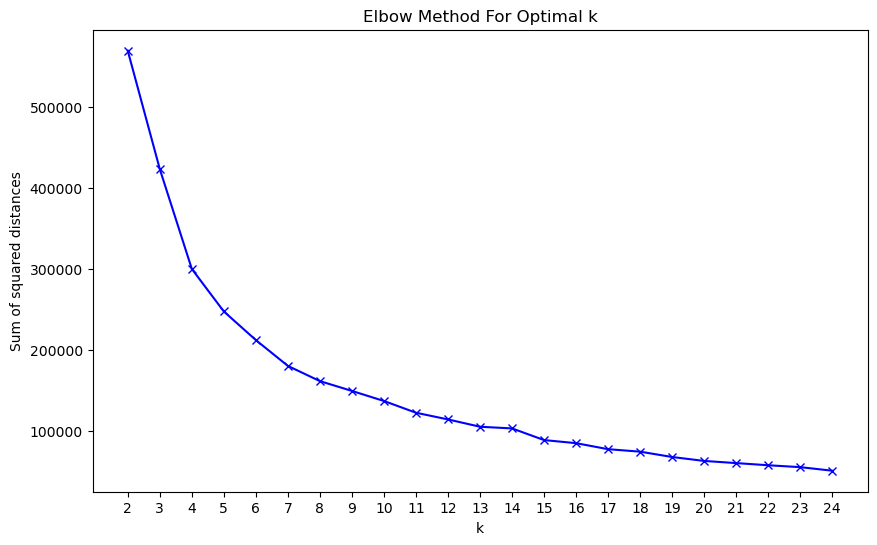

In [43]:
# Range of k values to try
k_values = range(2, len(set(scores["grade"])) + 1)  # Adjust this range based on your dataset

sum_of_squared_distances = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_extra_1)
    sum_of_squared_distances.append(kmeans.inertia_)

# Plotting the Elbow Graph
plt.figure(figsize=(10, 6))
plt.plot(k_values, sum_of_squared_distances, 'bx-')
plt.xlabel("k")
plt.ylabel("Sum of squared distances")
plt.title("Elbow Method For Optimal k")
plt.xticks(k_values)
plt.show()

In [44]:
clustered_temp_df_regular_extra_1 = temp_df_regular_extra_1

# Choosing the number of clusters
num_clusters = 6

# Applying K-Means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
clusters = kmeans.fit_predict(X_extra_1)

# Adding the cluster labels to the newly created replicate dataframe
clustered_temp_df_regular_extra_1['cluster'] = clusters

clustered_temp_df_regular_extra_1.head()

/usr/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


,code,#user_prompts,sentiment_score,#error,#no,#thank,#entropy,#df,#health,#metric,...,w492,w493,w494,w495,w496,w497,w498,w499,grade,cluster
1,0225686d-b825-4cac-8691-3a3a5343df2b,18.0,1.524702,0.0,0.0,0.0,3.0,0.0,6.0,4.0,...,0.105500,0.109587,0.071935,-0.034303,-0.076954,0.086845,-0.047115,0.038489,99.0,2
2,041f950b-c013-409a-a642-cffff60b9d4b,9.0,0.184702,3.0,0.0,1.0,7.0,0.0,8.0,8.0,...,0.107236,0.111493,0.054981,0.046572,-0.041067,0.045461,-0.069470,0.022174,90.0,1
3,04f91058-d0f8-4324-83b2-19c671f433dc,20.0,0.087500,1.0,0.0,0.0,4.0,0.0,2.0,3.0,...,0.007853,0.010195,0.004179,0.001311,-0.003819,0.004759,-0.007017,0.004175,97.0,2
4,089eb66d-4c3a-4f58-b98f-a3774a2efb34,86.0,9.962761,4.0,0.0,0.0,46.0,15.0,34.0,24.0,...,0.080433,0.075766,0.028062,0.025099,-0.055167,0.097092,-0.024599,0.080686,100.0,5
5,090d6217-5d69-4929-a342-19abab78324f,73.0,4.512838,25.0,0.0,0.0,27.0,7.0,12.0,12.0,...,0.099469,0.111414,0.023014,0.035870,-0.019179,0.046932,-0.038896,0.035830,84.0,1


## Decision Tree

In [45]:
regressor = DecisionTreeRegressor(random_state=0,criterion='squared_error', max_depth=10)
regressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=10, random_state=0)

In [46]:
################################################################
################################################################
##############       HYPERPARAMETER TUNING      ################
################################################################
################################################################

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)

# setup parameter space
parameters = {'criterion':['squared_error'],
              'max_depth':np.arange(1,21).tolist()[0::2],
              'min_samples_split':np.arange(2,11).tolist()[0::2],
              'max_leaf_nodes':np.arange(3,26).tolist()[0::2]}

# create an instance of the grid search object
g2 = GridSearchCV(DecisionTreeRegressor(), parameters, cv=5, n_jobs=-1)

# conduct grid search over the parameter space
start_time = time.time()
g2.fit(X_train,y_train)
duration = time.time() - start_time

# show best parameter configuration found for regressor
rgr_params1 = g2.best_params_
rgr_params1

X_train shape: (90, 33)
X_test shape: (23, 33)


{'criterion': 'squared_error',
 'max_depth': 1,
 'max_leaf_nodes': 3,
 'min_samples_split': 2}

In [47]:
extracted_MSEs = regressor.tree_.impurity   
for idx, MSE in enumerate(regressor.tree_.impurity):
    print("Node {} has MSE {}".format(idx,MSE))

Node 0 has MSE 44.95320987654304
Node 1 has MSE 68.23668639053267
Node 2 has MSE 68.42283950617184
Node 3 has MSE 57.84888888888963
Node 4 has MSE 46.693877551018886
Node 5 has MSE 36.591715976332125
Node 6 has MSE 27.3877551020405
Node 7 has MSE 8.66666666666697
Node 8 has MSE 0.0
Node 9 has MSE 1.0
Node 10 has MSE 0.0
Node 11 has MSE 0.0
Node 12 has MSE 2.75
Node 13 has MSE 1.0
Node 14 has MSE 0.0
Node 15 has MSE 0.0
Node 16 has MSE 0.0
Node 17 has MSE 17.805555555556566
Node 18 has MSE 4.25
Node 19 has MSE 0.22222222222262644
Node 20 has MSE 0.0
Node 21 has MSE 0.0
Node 22 has MSE 0.0
Node 23 has MSE 2.25
Node 24 has MSE 0.0
Node 25 has MSE 0.0
Node 26 has MSE 0.0
Node 27 has MSE 0.0
Node 28 has MSE 18.0
Node 29 has MSE 0.0
Node 30 has MSE 0.0
Node 31 has MSE 15.984375
Node 32 has MSE 4.66666666666606
Node 33 has MSE 0.0
Node 34 has MSE 0.25
Node 35 has MSE 0.0
Node 36 has MSE 0.0
Node 37 has MSE 4.399999999999636
Node 38 has MSE 0.22222222222080745
Node 39 has MSE 0.0
Node 40 has M

In [48]:
# Plotting the Tree 
dot_data = tree.export_graphviz(regressor, out_file=None, feature_names=temp_df_regular.columns[1:-1])
graph = graphviz.Source(dot_data)
graph.render("hw")

'hw.pdf'

In [49]:
# Prediction
y_train_pred = regressor.predict(X_train)
y_test_pred = regressor.predict(X_test)

# Calculation of Mean Absolute Error (MAE), Mean Squared Error (MSE), and R2 score
training_mae_3 = mean_squared_error(y_train, y_train_pred)
test_mae_3 = mean_absolute_error(y_test, y_test_pred)
training_mse_3 = mean_absolute_error(y_train, y_train_pred)
test_mse_3 = mean_squared_error(y_test, y_test_pred) 
training_r2_score_1 = r2_score(y_train, y_train_pred)
test_r2_score_1 = r2_score(y_test, y_test_pred)

print(f"Training MSE: {training_mse_3}")
print(f"Test MSE: {test_mse_3}")
print(f"Training MAE: {training_mae_3}")
print(f"Test MAE: {test_mae_3}")

print(f"Training R2: {training_r2_score_1}")
print(f"Test R2: {test_r2_score_1}")


Training MSE: 0.1807407407407409
Test MSE: 73.86869565217391
Training MAE: 0.16296296296296295
Test MAE: 6.852173913043478
Training R2: 0.9963748314433938
Test R2: -1.3605497160807047


## Random Forest

In [50]:
################################################################
################################################################
##########         RandomForestRegressor APPROACH      #########
################################################################
################################################################

# Extracting features (X) and target variable (y)
X = temp_df_regular[temp_df_regular.columns[1:-1]].to_numpy()
y = temp_df_regular["grade"].to_numpy()

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
print("Train set size:", len(X_train))
print("Test set size:", len(X_test))

# Setting up the parameter grid for grid search
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initializing the RandomForestRegressor
regressor = RandomForestRegressor(random_state=0)

# Creating the GridSearchCV object
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Fitting the model with the grid search parameters
grid_search.fit(X_train, y_train)

# Getting the best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Making predictions on the test set using the best model
best_regressor = grid_search.best_estimator_
test_predictions = best_regressor.predict(X_test)
train_predictions = best_regressor.predict(X_train)

# Evaluating the model
training_mae_4 = mean_absolute_error(y_train, train_predictions)
test_mae_4 = mean_absolute_error(y_test, test_predictions)
training_mse_4 = mean_squared_error(y_train, train_predictions)
test_mse_4 = mean_squared_error(y_test, test_predictions)

print(f"Training MAE: {training_mae_4}")
print(f"Test MAE: {test_mae_4}")
print(f"Training MSE: {training_mse_4}")
print(f"Test MSE: {test_mse_4}")

Train set size: 101
Test set size: 12
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 50}
Training MAE: 3.220086927501651
Test MAE: 5.315158365470662
Training MSE: 18.732761299106276
Test MSE: 41.14955242560628


## XGBoost

In [51]:
################################################################
################################################################
#############          XGBOOST APPROACH           ##############
################################################################
################################################################

X = temp_df_regular.drop(columns=['grade'])  # Features
y = temp_df_regular['grade']  # Target variable

print(temp_df_regular.head())

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train = X_train.drop(columns=['code'])
X_test = X_test.drop(columns=['code'])

                                   code  #user_prompts  sentiment_score  \
1  0225686d-b825-4cac-8691-3a3a5343df2b           18.0         1.524702   
2  041f950b-c013-409a-a642-cffff60b9d4b            9.0         0.184702   
3  04f91058-d0f8-4324-83b2-19c671f433dc           20.0         0.087500   
4  089eb66d-4c3a-4f58-b98f-a3774a2efb34           86.0         9.962761   
5  090d6217-5d69-4929-a342-19abab78324f           73.0         4.512838   

   #error  #no  #thank  #entropy   #df  #health  #metric  ...       Q_0  \
1     0.0  0.0     0.0       3.0   0.0      6.0      4.0  ...  0.691143   
2     3.0  0.0     1.0       7.0   0.0      8.0      8.0  ...  0.282934   
3     1.0  0.0     0.0       4.0   0.0      2.0      3.0  ...  0.483207   
4     4.0  0.0     0.0      46.0  15.0     34.0     24.0  ...  0.345360   
5    25.0  0.0     0.0      27.0   7.0     12.0     12.0  ...  0.302311   

        Q_1       Q_2       Q_3       Q_4       Q_5       Q_6       Q_7  \
1  0.729580  0.934919  

In [52]:
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("MSE Train:", mean_squared_error(y_train,model.predict(X_train)))
print("MSE TEST:", mean_squared_error(y_test,y_pred))

print("R2 Train:", r2_score(y_train,model.predict(X_train)))
print("R2 TEST:", r2_score(y_test,y_pred))

MSE Train: 4.418433592137363e-07
MSE TEST: 37.03073011638354
R2 Train: 0.9999999901710387
R2 TEST: -0.18335485269825336


In [53]:
param_grid = {
    'min_child_weight': [1, 5, 10],
    'gamma': [0.5, 1, 1.5, 2, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'max_depth': [3, 4, 5]
}

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Printing the best hyperparameters
print("Best Hyperparameters:")
print(best_params)

# Making predictions using the best model
final_predictions = best_model.predict(X_test)

# Evaluating the best model
mae = mean_absolute_error(y_test, final_predictions)
mse = mean_squared_error(y_test, final_predictions)
r2 = r2_score(y_test, final_predictions)

# Print evaluation metrics
print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')


Best Hyperparameters:
{'colsample_bytree': 0.6, 'gamma': 2, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.6}
Mean Absolute Error: 5.105745730192765
Mean Squared Error: 37.542362886544254
R-squared: -0.19970460112250232


In [54]:
X = temp_df_regular.drop(columns=['grade'])  # Features
y = temp_df_regular['grade']  # Target variable

# Drop 'code' column before splitting
X = X.drop(columns=['code'])

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# XGBoost model
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# K-fold cross-validation
cv_results = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

# Displaying cross-validation results
print("Cross-validation Results:")
print("Negative Mean Squared Errors:", cv_results)
print("Average Negative Mean Squared Error:", cv_results.mean())

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'min_child_weight': [1, 5, 10],
    'gamma': [0.5, 1, 1.5, 2, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'max_depth': [3, 4, 5]
}

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Getting the best hyperparameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Printing the best hyperparameters
print("\nBest Hyperparameters:")
print(best_params)

# Making predictions using the best model
test_final_predictions = best_model.predict(X_test)
train_final_predictions = best_model.predict(X_train)

# Evaluating the best model
training_mae_5 = mean_absolute_error(y_train, train_final_predictions)
test_mae_5 = mean_absolute_error(y_test, test_final_predictions)
training_mse_5 = mean_squared_error(y_train, train_final_predictions)
test_mse_5 = mean_squared_error(y_test, test_final_predictions)
test_r2_score_2 = r2_score(y_test, test_final_predictions)

print(f"Training MAE: {training_mae_5}")
print(f"Test MAE: {test_mae_5}")
print(f"Training MSE: {training_mse_5}")
print(f"Test MSE: {test_mse_5}")
print(f"Test R2 score: {test_r2_score_2}")

Cross-validation Results:
Negative Mean Squared Errors: [-61.72087632 -50.0770446  -70.28541173 -81.01684599 -59.65401473]
Average Negative Mean Squared Error: -64.5508386748028

Best Hyperparameters:
{'colsample_bytree': 0.6, 'gamma': 2, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.6}
Training MAE: 0.40107489691840276
Test MAE: 5.105745730192765
Training MSE: 0.27417732529833705
Test MSE: 37.542362886544254
Test R2 score: -0.19970460112250232


## Dummy Classifiers

In [55]:
temp_df_above_70 = temp_df_regular[temp_df_regular["grade"] >= 70]

X = temp_df_above_70[temp_df_above_70.columns[1:-1]].to_numpy()
y = temp_df_above_70["grade"].to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Calculating the mean of training set grades
average_grade = y_train.mean()

# Assigning the mean grade as the prediction for all instances in the test set
test_constant_predictions = np.full_like(y_test, fill_value=average_grade)
train_constant_predictions = np.full_like(y_train, fill_value=average_grade)

# Evaluating the constant prediction
training_mae_6 = mean_absolute_error(y_train, train_constant_predictions)
training_mse_6 = mean_squared_error(y_train, train_constant_predictions)
test_mae_6 = mean_absolute_error(y_test, test_constant_predictions)
test_mse_6 = mean_squared_error(y_test, test_constant_predictions)
test_r2_score_3 = r2_score(y_test, test_constant_predictions)

# Printing evaluation metrics for the constant prediction using mean
print(f"Training MAE: {training_mae_6}")
print(f"Test MAE: {test_mae_6}")
print(f"Training MSE: {training_mse_6}")
print(f"Test MSE: {test_mse_6}")
print(f"Test R2 score: {test_r2_score_3}")

Training MAE: 5.269876543209874
Test MAE: 4.6932367149758445
Training MSE: 44.95320987654321
Test MSE: 31.37674181427805
Test R2 score: -0.0026758740940608927


In [56]:
# Calculating the median of training set grades
median_grade = np.median(y_train)

# Assigning the median grade as the prediction for all instances in the test set
test_constant_predictions_median = np.full_like(y_test, fill_value=median_grade)
train_constant_predictions_median = np.full_like(y_train, fill_value=median_grade)

# Evaluating the constant prediction
training_mae_7 = mean_absolute_error(y_train, train_constant_predictions_median)
training_mse_7 = mean_squared_error(y_train, train_constant_predictions_median) 
test_mae_7 = mean_absolute_error(y_test, test_constant_predictions_median)
test_mse_7 = mean_squared_error(y_test, test_constant_predictions_median)
test_r2_score_4 = r2_score(y_test, test_constant_predictions_median)

# Printing evaluation metrics for the constant prediction using mean
print(f"Training MAE: {training_mae_7}")
print(f"Test MAE: {test_mae_7}")
print(f"Training MSE: {training_mse_7}")
print(f"Test MSE: {test_mse_7}")
print(f"Test R2 score: {test_r2_score_4}")

Training MAE: 4.988888888888889
Test MAE: 4.739130434782608
Training MSE: 49.74444444444445
Test MSE: 37.43478260869565
Test R2 score: -0.196266763320043


# Evaluation

In [67]:
maes = {"Neural Network 1 (W2V vector is excluded)": {"Training": training_mae_1, "Test":  test_mae_1},
        "Neural Network 2 (W2V vector is included)": {"Training": training_mae_2, "Test": test_mae_2},
        "Decision Tree": {"Training": training_mae_3, "Test": test_mae_3},
        "Random Forest": {"Training": training_mae_4, "Test": test_mae_4},
        "XGBoost": {"Training": training_mae_5, "Test": test_mae_5},
        "Mean (Dummy Classifier)": {"Training": training_mae_6, "Test": test_mae_6},
        "Median (Dummy Classifier)": {"Training": training_mae_7, "Test": test_mae_7}}

mses = {"Neural Network 1 (W2V vector is excluded)": {"Training": training_mse_1, "Test":  test_mse_1},
        "Neural Network 2 (W2V vector is included)": {"Training": training_mse_2, "Test": test_mse_2},
        "Decision Tree": {"Training": training_mse_3, "Test": test_mse_3},
        "Random Forest": {"Training": training_mse_4, "Test": test_mse_4},
        "XGBoost": {"Training": training_mse_5, "Test": test_mse_5},
        "Mean (Dummy Classifier)": {"Training": training_mse_6, "Test": test_mse_6},
        "Median (Dummy Classifier)": {"Training": training_mse_7, "Test": test_mse_7}}

In [58]:
def plot_metrics(metrics, title):
    models = list(metrics.keys())
    training_errors = [metrics[model]['Training'] for model in models]
    test_errors = [metrics[model]['Test'] for model in models]

    # Setting the positions and width for the bars
    pos = np.arange(len(models))
    bar_width = 0.35

    plt.figure(figsize=(10, 6))
    plt.bar(pos, training_errors, bar_width, label='Training', alpha=0.7)
    plt.bar(pos + bar_width, test_errors, bar_width, label='Test', alpha=0.7)

    plt.xlabel('Models')
    plt.ylabel('Error')
    plt.title(title)
    plt.xticks(pos + bar_width / 2, models, rotation=45, ha="right")
    plt.legend()
    plt.tight_layout()

    plt.show()

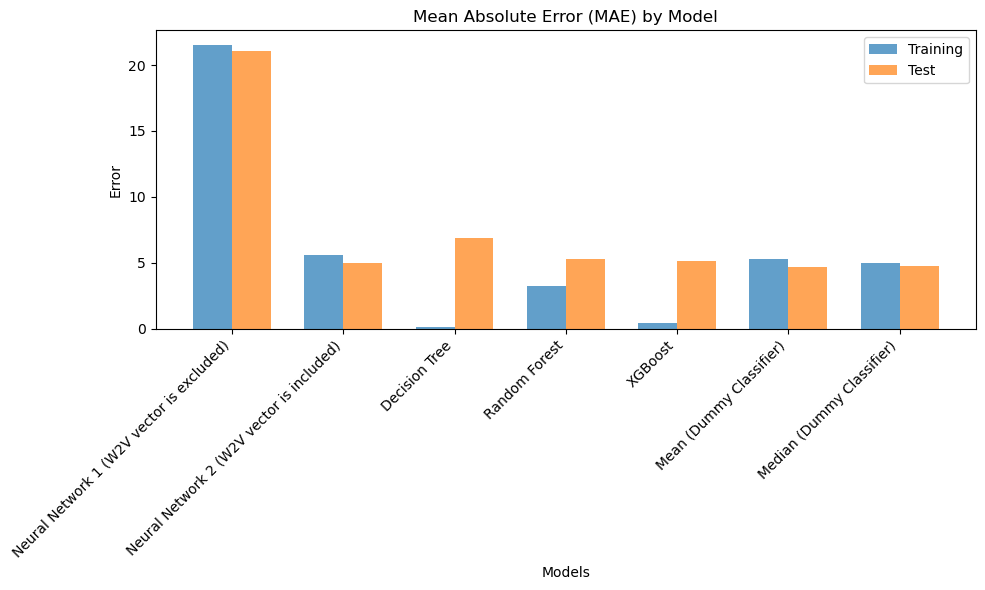

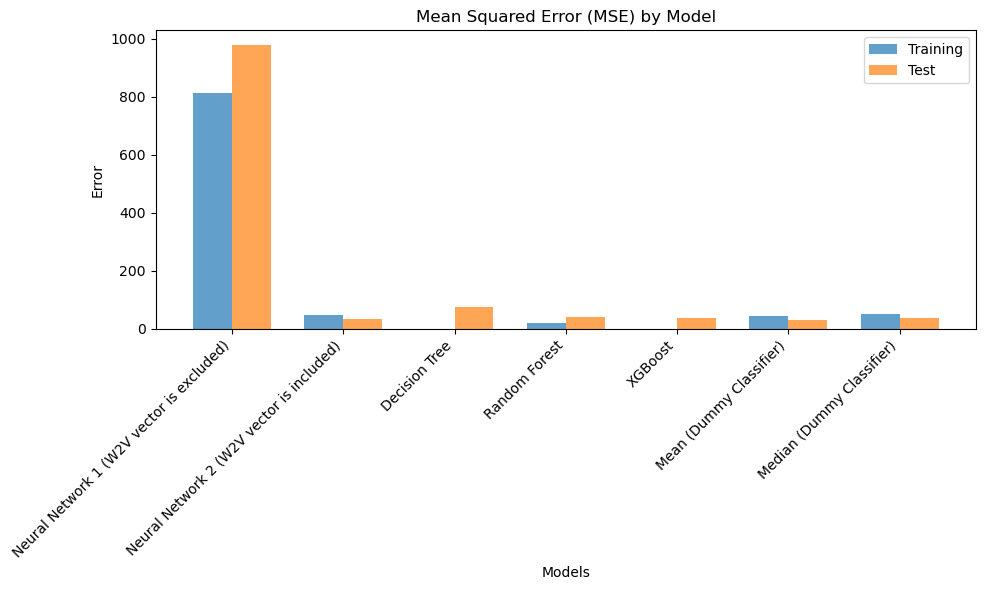

In [68]:
plot_metrics(maes, "Mean Absolute Error (MAE) by Model")
plot_metrics(mses, "Mean Squared Error (MSE) by Model")

/tmp/ipykernel_48672/697725.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data["y_random"] = np.random.rand(len(plot_data))


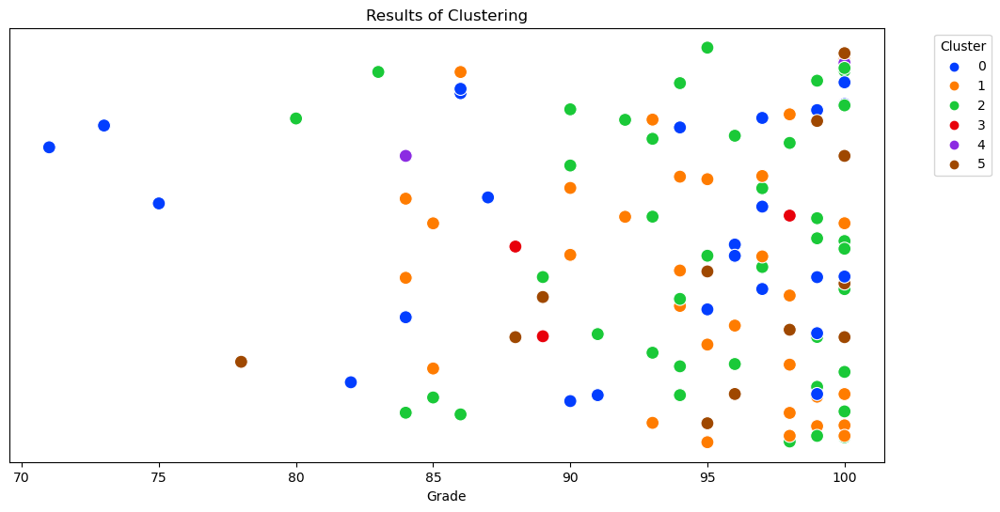

In [60]:
# Extracting "grade" and "cluster" for the plot
plot_data = clustered_temp_df_regular_extra_1[["grade", "cluster"]]

# Creating a new column for y-axis to represent clusters distinctly
plot_data["y_random"] = np.random.rand(len(plot_data))

# Plotting
plt.figure(figsize=(12, 6))
sns.scatterplot(x="grade", y="y_random", hue="cluster", data=plot_data, palette="bright", legend="full", s=100)  # s is the size of points
plt.title("Results of Clustering")
plt.xlabel("Grade")
plt.ylabel("")
plt.yticks([])  # Hiding y-axis ticks
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc=2)  # Moving the legend outside the plot
plt.show()

In [69]:
print("MAEs of our models: ")
pprint(maes)

print("MSEs of our models: ")
pprint(mses)

MAEs of our models: 
{'Decision Tree': {'Test': 6.852173913043478, 'Training': 0.16296296296296295},
 'Mean (Dummy Classifier)': {'Test': 4.6932367149758445,
                             'Training': 5.269876543209874},
 'Median (Dummy Classifier)': {'Test': 4.739130434782608,
                               'Training': 4.988888888888889},
 'Neural Network 1 (W2V vector is excluded)': {'Test': 21.061151587444805,
                                               'Training': 21.556294928656683},
 'Neural Network 2 (W2V vector is included)': {'Test': 4.966083692467731,
                                               'Training': 5.615404256184896},
 'Random Forest': {'Test': 5.315158365470662, 'Training': 3.220086927501651},
 'XGBoost': {'Test': 5.105745730192765, 'Training': 0.40107489691840276}}
MSEs of our models: 
{'Decision Tree': {'Test': 73.86869565217391, 'Training': 0.1807407407407409},
 'Mean (Dummy Classifier)': {'Test': 31.37674181427805,
                             'Training': 44.